# 0) Import packages

In [2]:
import numpy as np
import math
import csv
import matplotlib.pyplot as plt
import networkx as nx
import random
import time

# 1) Introduction

The aim of today is to simulate several dynamics of propagation in a network.

# 2) Project (Week 10)

##### a) Depending on what seems more relevant in your graph. Write the code for one of the alternative model not covered today.
    
    - Threshold model synchroneous,
    - Threshold model asynchroneous (random order),
    - Fractional Threshold model synchroneous,
    - Fractional Threshold model (random order).
    - Independent Cascade model,
    - Bass contagion model,
    - SIS model,
    - A variant that seems pertinent in your graph (Best choice).
    
  
b) Investigate different scenario of outbreak in your graph (different size of outbreaks, different origins, different parameters). Some propositions are made later in this file.

# 3) Initialization of the graph

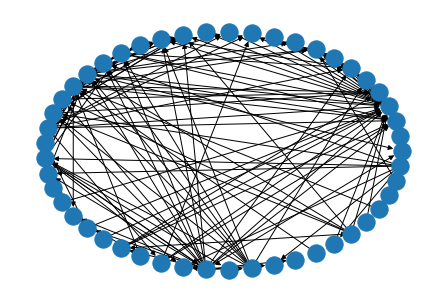

In [3]:
sna_advice=[('Venel', 'Giubilei'), ('Beltrame', 'Cadura'), ('Beltrame', 'Cardile'), ('Beltrame', 'Lischi'), ('Beltrame', 'Mohn'), ('Beltrame', 'Spadaccia'), ('Cadura', 'Beltrame'), ('Cadura', 'Bresolin'), ('Cadura', 'Cardile'), ('Cadura', 'Carucci'), ('Cadura', 'El Arrag'), ('Cadura', 'Giubilei'), ('Cadura', 'Hindawi'), ('Cadura', 'Mainetti'), ('Cadura', 'Mimun'), ('Cadura', 'Mohn'), ('Cadura', 'Nota'), ('Cadura', 'Serandrei'), ('Cadura', 'Spadaccia'), ('Cadura', 'Venel'), ('Mohn', 'Beltrame'), ('Mohn', 'Bresolin'), ('Mohn', 'Cadura'), ('Mohn', 'Cardile'), ('Mohn', 'Serandrei'), ('Stanziola', 'Capo'), ('Stanziola', 'Policastro'), ('Capo', 'Beltrame'), ('Capo', 'Cadura'), ('Capo', 'Giannandrea'), ('Capo', 'Girardi'), ('Capo', 'Mohn'), ('Capo', 'Nota'), ('Capo', 'Serandrei'), ('Policastro', 'Girardi'), ('Nota', 'Di Mario'), ('Nota', 'Di Segni'), ('Nota', 'Giannandrea'), ('Di Mario', 'Cardile'), ('Di Segni', 'Cardile'), ('Di Segni', 'Nota'), ('Giannandrea', 'Beltrame'), ('Giannandrea', 'Bresolin'), ('Giannandrea', 'Cadura'), ('Giannandrea', 'Capo'), ('Giannandrea', 'Carucci'), ('Giannandrea', 'Damasco'), ('Giannandrea', 'De Leo'), ('Giannandrea', 'Dospinescu'), ('Giannandrea', 'Formiconi'), ('Giannandrea', 'Mainetti'), ('Giannandrea', 'Nota'), ('Giannandrea', 'Policastro'), ('Giannandrea', 'Venel'), ('Salem', 'Salem'), ('Shkreli', 'Cadura'), ('Girardi', 'Beltrame'), ('Girardi', 'Bresolin'), ('Girardi', 'Cadura'), ('Girardi', 'Cardile'), ('Girardi', 'De Leo'), ('Girardi', 'Pazzaglia'), ('Girardi', 'Policastro'), ('Girardi', 'Serandrei'), ('Wu', 'Cadura'), ('Wu', 'De Leo'), ('Giordano', 'Cadura'), ('Magri', 'Beltrame'), ('Magri', 'Cadura'), ('Magri', 'Cardile'), ('Aprea', 'Girardi'), ('Aprea', 'Pazzaglia'), ('Damasco', 'Beltrame'), ('Damasco', 'Cadura'), ('Damasco', 'Girardi'), ('Damasco', 'Hindawi'), ('Damasco', 'Mainetti'), ('Damasco', 'Mohn'), ('Damasco', 'Mosca'), ('Damasco', 'Policastro'), ('Dospinescu', 'Capo'), ('Dospinescu', 'Di Segni'), ('Dospinescu', 'Ferraresi'), ('Dospinescu', 'Filangieri'), ('Dospinescu', 'Giannandrea'), ('Dospinescu', 'Girardi'), ('Dospinescu', 'Pacielli'), ('Dospinescu', 'Pazzaglia'), ('Filangieri', 'Beltrame'), ('Filangieri', 'Cadura'), ('Filangieri', 'Capo'), ('Filangieri', 'Di Mario'), ('Filangieri', 'Di Segni'), ('Filangieri', 'Dospinescu'), ('Filangieri', 'Ferraresi'), ('Filangieri', 'Formiconi'), ('Filangieri', 'Giannandrea'), ('Filangieri', 'Macis'), ('Filangieri', 'Magri'), ('Filangieri', 'Mohn'), ('Filangieri', 'Natoli'), ('Filangieri', 'Nota'), ('Filangieri', 'Pazzaglia'), ('Filangieri', 'Policastro'), ('Filangieri', 'Serandrei'), ('Filangieri', 'Trimarchi'), ('Filangieri', 'Venel'), ('Filangieri', 'Wu'), ('Macis', 'Capo'), ('Macis', 'Di Segni'), ('Macis', 'Dospinescu'), ('Macis', 'Giannandrea'), ('Macis', 'Girardi'), ('Macis', 'Lischi'), ('Macis', 'Policastro'), ('Macis', 'Serandrei'), ('Milano', 'Girardi'), ('Ben Belhassen', 'Cadura'), ('De Marinis', 'Cadura'), ('De Marinis', 'Di Mario'), ('De Marinis', 'Di Segni'), ('De Marinis', 'Giannandrea'), ('De Marinis', 'Magri'), ('De Marinis', 'Nota'), ('Martini', 'Cadura'), ('Stella', 'Girardi'), ('Teimourpour', 'Teimourpour'), ('Mosca', 'Beltrame'), ('Mosca', 'Cadura'), ('Mosca', 'Hindawi'), ('Tiberi', 'Bresolin'), ('Fornari', 'Beltrame'), ('Fornari', 'Ben Belhassen'), ('Fornari', 'Di Segni'), ('Fornari', 'Dospinescu'), ('Fornari', 'Ferraresi'), ('Fornari', 'Formiconi'), ('Fornari', 'Natoli'), ('Fornari', 'Policastro')]

G_SNA=nx.DiGraph()
G_SNA.add_edges_from(sna_advice)
N_SNA=G_SNA.number_of_nodes()

nx.draw_circular(G_SNA)

list_of_names=['Venel', 'Giubilei', 'Beltrame', 'Cadura', 'Cardile', 'Lischi', 'Mohn', 'Spadaccia', 'Bresolin', 'Carucci', 'El Arrag', 'Hindawi', 'Mainetti', 'Mimun', 'Nota', 'Serandrei', 'Stanziola', 'Capo', 'Policastro', 'Giannandrea', 'Girardi', 'Di Mario', 'Di Segni', 'Damasco', 'De Leo', 'Dospinescu', 'Formiconi', 'Salem', 'Shkreli', 'Pazzaglia', 'Wu', 'Giordano', 'Magri', 'Aprea', 'Mosca', 'Ferraresi', 'Filangieri', 'Pacielli', 'Macis', 'Natoli', 'Trimarchi', 'Milano', 'Ben Belhassen', 'De Marinis', 'Martini', 'Stella', 'Teimourpour', 'Tiberi', 'Fornari']


# 4) Threshold model (Deterministic updating)

We consider an outbreak on, I, a set of nodes and study the propagation for a given threshold  in the graph G. We program an asynchroneous version where we go over the list of nodes and activate new nodes.

We fix also a time limit

The key difference with what we have done until now is the necessity to add a label to the node. We define for each node a category which can take two values: Inactive and Active.

In [4]:
def simulation_threshold_plot(G,threshold,I,time_limit): #Parameters: the graph, the threshold,
    #the initial outbreak, a limit on the number of iteration to avoid a program never stopping

    #   Initialization of the types
    for node in G.nodes():
        G.nodes[node]['category'] ='Inactive'

    for node in I: #initial outbreak
        G.nodes[node]['category'] ='Active'

    n=G.number_of_nodes()
    
    # Plot using the type for the coloring
    color_map = {'Inactive':'w', 'Active':'r'}  # Map from type to color
    nx.draw_circular(G,node_size=150,with_labels=False, node_color=[color_map[G.nodes[node]['category']] for node in G]) # Plot using the map to decide the color
    plt.show()
    
    # Iteration
    t=1
    
    while t<=time_limit-1:
        t=t+1
                
        for node in G.nodes(): # go over the nodes
            neighbor_active=0   # initialize a counter for the number of active neighbor.
            for neighbor in G.neighbors(node): # go over neighbors and add one for each active neighbor.
                
                if G.nodes[neighbor]['category']=='Active':
                    neighbor_active=neighbor_active+1
                else:
                    neighbor_active=neighbor_active
            
            if neighbor_active>=threshold: # Check if the threshold is reached. If so active the node
                G.nodes[node]['category']='Active'
                
        #we plot only at the end of the iteration
        nx.draw_circular(G,node_size=150,with_labels=False, node_color=[color_map[G.nodes[node]['category']] for node in G]) 
        plt.show()


In [5]:
I=['Venel']

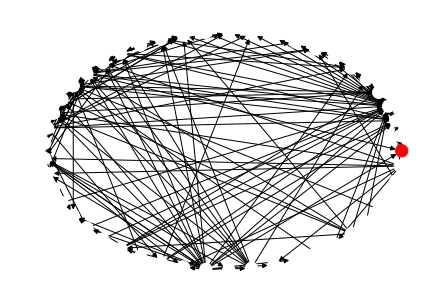

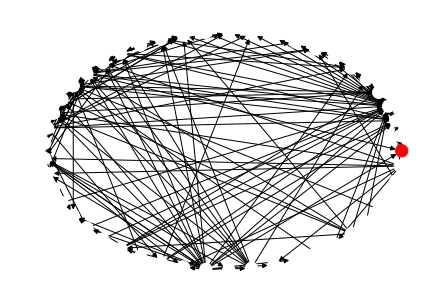

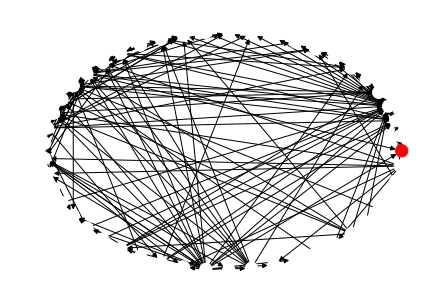

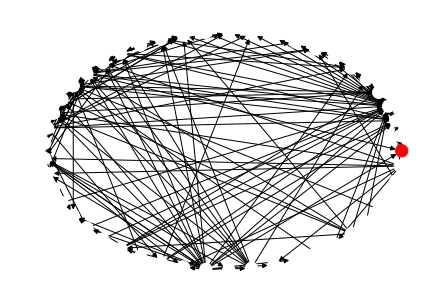

In [6]:
simulation_threshold_plot(G_SNA,2,I,4)

In [7]:
I=['Venel','Giubilei','Mimun']

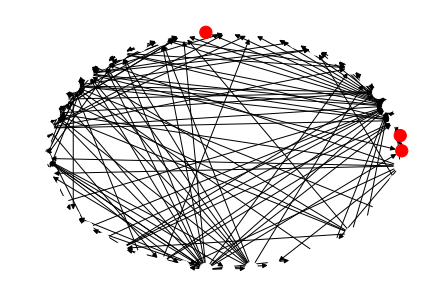

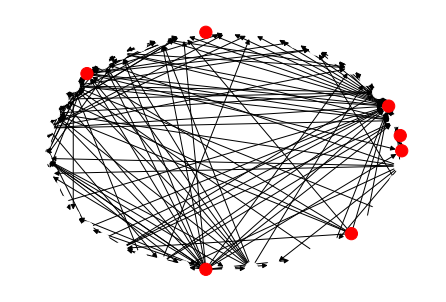

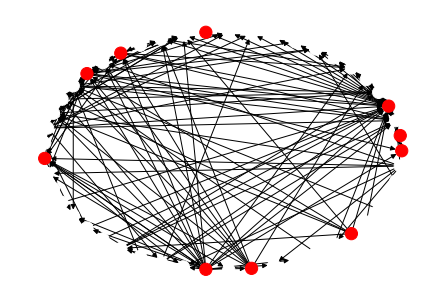

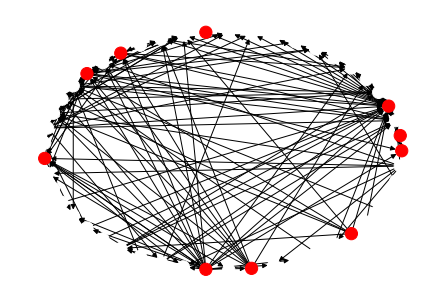

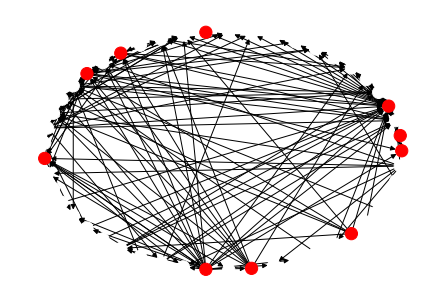

...

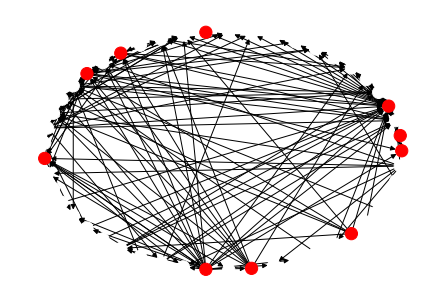

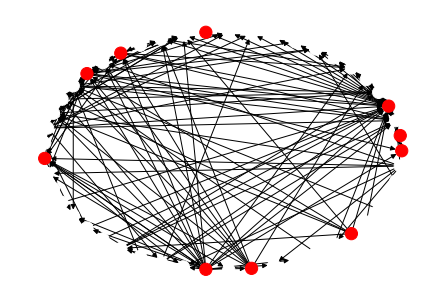

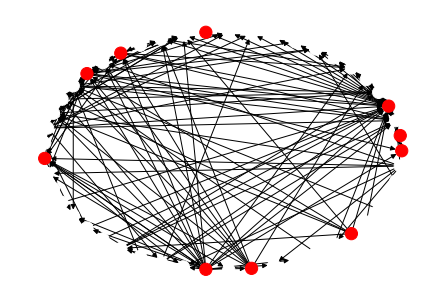

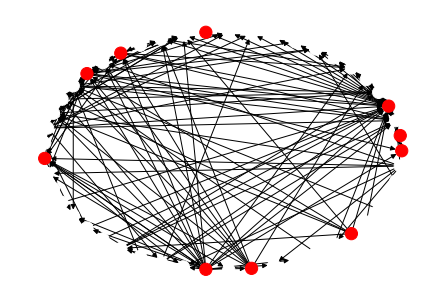

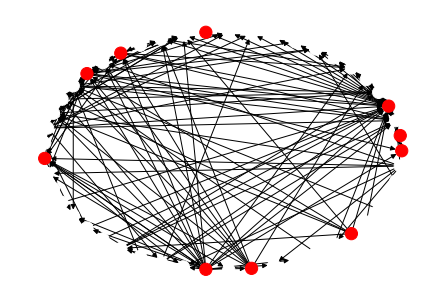

In [8]:
simulation_threshold_plot(G_SNA,2,I,20)

### How can we evaluate the outbreak

We can evaluate many different things:
    
    - Number of Activate agents at a fixed time T,

    - Time to reach a given fraction f of the network,
    
    - Minimum number of agents in the Outbreak to reach a fraction f of the network or all the network,
    
    - Compare different outbreak from different sets,
    
    - Try to find the best set of agents for an outbreak of fixed size. (High computational complexity, may need to be weakened)
    
    - ....

We consider a threshold of 1 and investigate which agent leads to the worst outbreak after 2 steps of contagion. To do so, we need to change the previous function to return the number of active agents.

Then, we design another function that check the contagion process for every initial node contaminated and create a list with the results.


In [8]:
def simulation_threshold_active_end(G,threshold,I,time_limit):

    #   Initialization of the types
    for node in G.nodes():
        G.nodes[node]['category'] ='Inactive'

    for node in I:
        G.nodes[node]['category'] ='Active'

    n=G.number_of_nodes()
    
    # Iteration
    t=1
    
    while t<=time_limit-1:
        t=t+1
                
        for node in G.nodes(): # go over the n odes
            neighbor_active=0   # initialize a counter for the number of active neighbor.
            for neighbor in G.neighbors(node): # go over neighbors and add one for each active nieghbor.
                
                if G.nodes[neighbor]['category']=='Active':
                    neighbor_active=neighbor_active+1
                else:
                    neighbor_active=neighbor_active
            
            if neighbor_active>=threshold:
                G.nodes[node]['category']='Active'
        
    active=0   # initialize a counter for the number of active nodes.
    
    for node in G.nodes(): # go over all nodes and add one for each active nieghbor.
        if G.nodes[node]['category']=='Active':
            active=active+1
        else:
            active=active        
    
    return active # return the number of active nodes
     

In [9]:
def comparison_centrality_threshold_limit(G,threshold,time_limit):
    
    data_y=[] # empty list where we will stock the number of nodes active for each starting outbreak
    
    for node in G.nodes():
        y=simulation_threshold_active_end(G,threshold,[node],time_limit) # simulate from an outbreak at node "node"
        data_y.append(y) # add the value to the list
        
    return data_y

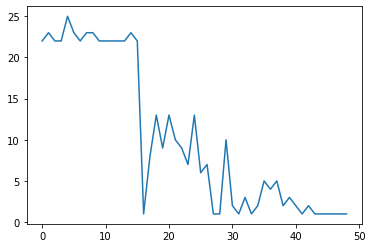

In [10]:
centrality_threshold=comparison_centrality_threshold_limit(G_SNA,1,2)
plt.plot(centrality_threshold)

# SIR Model in a graph

We now develop a model of contagion SIR inside a fixed graph. The function takes as parameter a graph, a set of initial outbreak, a time limit, the contagion parameter and the recovery parameter and a parameter to plot or not.

In [13]:
def simulation_SIR_network(G,I,T,beta,mu,graph):
    # initialisation of the number of each node
    s=0 
    i=0
    r=0
    
    n0=G.number_of_nodes()
    
    for node in G.nodes(): # Initialization of the agent in I as infected and other agent as susceptible
       if node in I: 
           G.nodes[node]['category'] ='type_I'
           i=i+1
       else:
           G.nodes[node]['category'] ='type_S'
           s=s+1
           
    color_map = {'type_S':'b', 'type_I':'r','type_R':'g'}  # 3 colors
    
    
    if graph==True:  # plot or not
        nx.draw_circular(G,node_size=50, node_color=[color_map[G.nodes[node]['category']] for node in G]) # plot with the colors
        plt.show()
     
    t=0  # create variable to keep track of the evolutions
    data_S=[]
    data_I=[]
    data_R=[]
    n=n0-1
    
    # initialization
    data_I.append(i)  
    data_R.append(r)  
    data_S.append(s)  
    
    while (t <=T) and (i!=0) : # Stop when the time limit is reached or 
        #there is no infected anymore since the process does not change anymore
        
        # Count interation
        t=t+1
        
        # We do an asynchroneous version where we update
        #along the play. We go over the nodes and check if we need to change his status or not.
        
        for node in G.nodes(): # go over the node
    
            switch=0 # we want to allow only one change for a given node by iteration. for that we create a variable remembering if the node has already changed of status during the current iteration.
            
            # if the node is recovered 
            if (G.nodes[node]['category']=='type_I')and (random.uniform(0, 1)<=mu):
                G.nodes[node]['category']='type_R'
                
                #update number of nodes in each category
                i=i-1
                r=r+1
                switch=1 # changed
            
            # if the node is susceptible
            
            if (G.nodes[node]['category']=='type_S') and (switch==0): # does not do if the node just changed of status.
                for neighbor in G.neighbors(node): #go over neighbors of the current node

                    if (G.nodes[neighbor]['category']=='type_I') and (random.uniform(0, 1)<=beta) and (switch==0): # if not changed, neighbors I and contagion successful
                        G.nodes[node]['category']='type_I'  
                        
                        #update number of nodes in each category
                        s=s-1
                        i=i+1
                        switch=1 # changed
            
            
                
        # Plotting part
        if graph==True: # plot or not
            nx.draw_circular(G,node_size=50, node_color=[color_map[G.nodes[node]['category']] for node in G])
            plt.show()

        
        # update the list for the current stage
        data_I.append(i)  
        data_R.append(r)  
        data_S.append(s)  
        
    # list of iteration for ploting
    data_x=range(t+1)
        

    return data_x,data_S,data_I,data_R,G # return list of time, number of S/I/R and the final graph.

We now consider who is the best gossip spreader in the SNA network. We assume that the probability to top propagating the gossip is 1/10  hence in expectation an infected stay infected for 10 days. In average 3 out of 4 meetings leads to the gossip to be propagated.

In [25]:
T=100
beta=3/4
mu=1/10

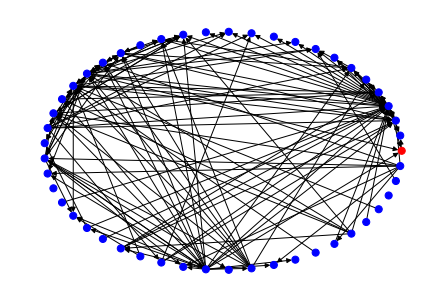

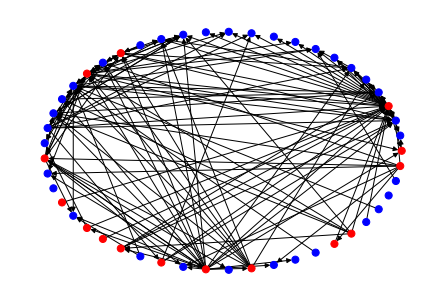

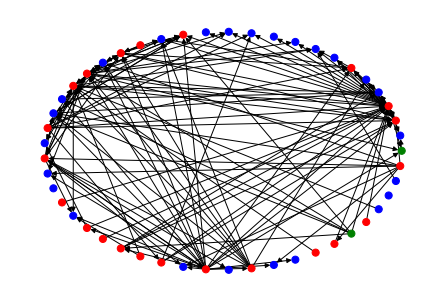

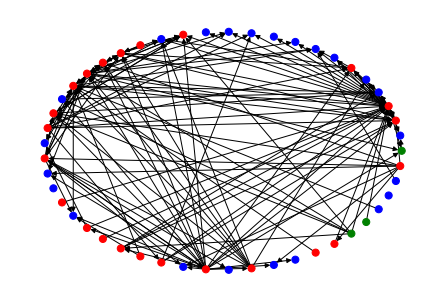

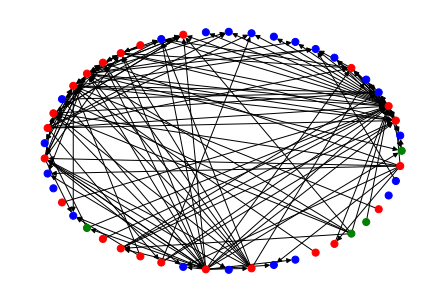

...

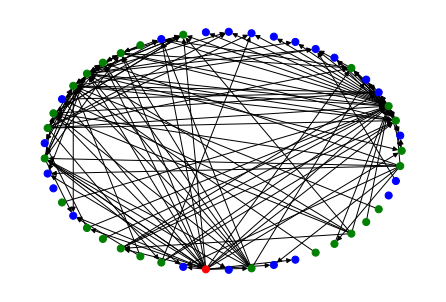

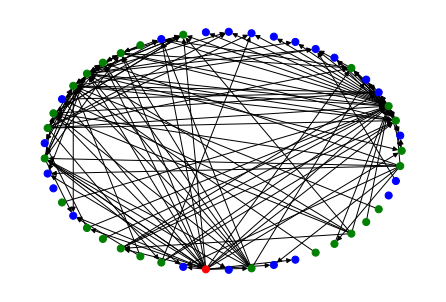

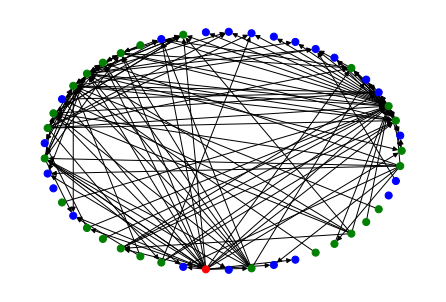

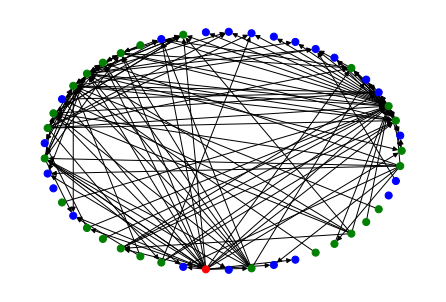

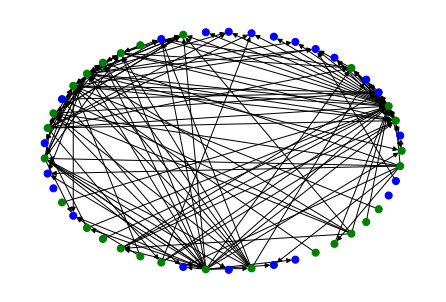

In [26]:
data_x_SIR,data_S_SIR,data_I_SIR,data_R_SIR,G=simulation_SIR_network(G_SNA,['Venel'],T,beta,mu,True)

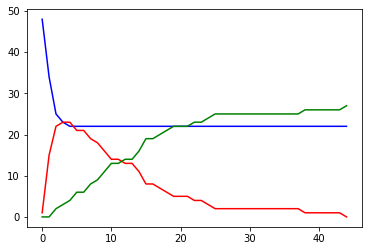

In [27]:
plt.plot(data_x_SIR,data_S_SIR,'b',data_x_SIR,data_I_SIR,'r',data_x_SIR,data_R_SIR,'g')

We are wondering who lead to the highest number or recovered. Since we rely on simulation, it is possible that one run of the program get very lucky or very unlucky. In order to correct for that, we do several similation from each starting nodes. One can see it with the interior loop on t.

In [28]:
def comparison(G,iteration,time,beta,gamma):
    data=[]
    
    for node in G.nodes(): # loop over node
        recovered=0  
        for i in range(iteration): # several iteration for the same node
            I=[node]
            data_x_SIR,data_S_SIR,data_I_SIR,data_R_SIR,G=simulation_SIR_network(G,I,time,beta,gamma,False)
            recovered=recovered+data_R_SIR[len(data_R_SIR)-1]
        
        data.append(recovered/t)
                                           
    return data

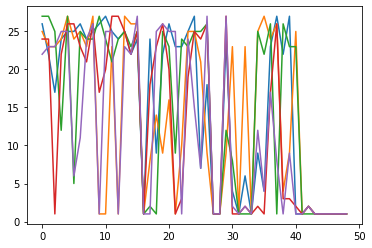

In [31]:
t=1
data=comparison(G_SNA,t,50,1/2,1/4)
plt.plot(data)

data=comparison(G_SNA,t,50,1/2,1/4)
plt.plot(data)
data=comparison(G_SNA,t,50,1/2,1/4)
plt.plot(data)
data=comparison(G_SNA,t,50,1/2,1/4)
plt.plot(data)
data=comparison(G_SNA,t,50,1/2,1/4)
plt.plot(data)


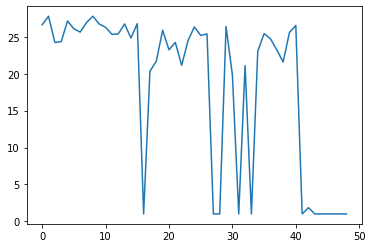

In [34]:
t=20
data=comparison(G_SNA,t,300,3/4,1/10)
plt.plot(data)